In [96]:
import pandas as pd
import numpy as np

In [97]:
df = pd.read_csv('../cured_imdb.csv', low_memory=False)

In [98]:
df

,Unnamed: 0.1,Unnamed: 0,dob,photo_taken,full_path,gender,name,face_location,face_score,second_face_score,celeb_names,celeb_id,age,max_image_dim
0,0,0,1899,1968,01/nm0000001_rm124825600_1899-5-10_1968.jpg,1.0,['Fred Astaire'],[[1072.926 161.838 1214.784 303.696]],1.459693,1.118973,"[""'Lee' George Quinones""]",6488,69,141.858000
1,1,1,1899,1970,01/nm0000001_rm3343756032_1899-5-10_1970.jpg,1.0,['Fred Astaire'],[[477.184 100.352 622.592 245.76 ]],2.543198,1.852008,"[""'Weird Al' Yankovic""]",6488,71,145.408000
2,3,3,1899,1968,01/nm0000001_rm946909184_1899-5-10_1968.jpg,1.0,['Fred Astaire'],[[622.88550564 424.21750384 844.33900767 645.6...,1.872117,NaN,['50 Cent'],6488,69,221.453502
3,4,4,1899,1968,01/nm0000001_rm980463616_1899-5-10_1968.jpg,1.0,['Fred Astaire'],[[1013.85900236 233.88204221 1201.5861278 4...,1.158766,NaN,['A Martinez'],6488,69,187.727125
4,6,6,1924,2004,02/nm0000002_rm1346607872_1924-9-16_2004.jpg,0.0,['Lauren Bacall'],[[ 78.23569407 52.33512938 194.25423516 168.3...,3.479189,NaN,['A.J. Buckley'],11516,80,116.018541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121959,460705,460705,1989,2011,08/nm3994408_rm540716544_1989-12-29_2011.jpg,0.0,['Jane Levy'],[[249.2290693 88.51449505 379.87081187 219.1...,2.663068,NaN,NaN,8410,22,130.641743
121960,460707,460707,1989,2011,08/nm3994408_rm543141888_1989-12-29_2011.jpg,0.0,['Jane Levy'],[[321.23 146.51 451.36 276.64]],2.222078,0.776222,NaN,8410,22,130.130000
121961,460712,460712,1989,2012,08/nm3994408_rm663989760_1989-12-29_2012.jpg,0.0,['Jane Levy'],[[1094.72200993 151.04900135 1316.17551196 3...,3.594701,2.786236,NaN,8410,23,221.453502
121962,460716,460716,1989,2011,08/nm3994408_rm744468480_1989-12-29_2011.jpg,0.0,['Jane Levy'],[[300.756 96.276 422.592 218.112]],2.370091,NaN,NaN,8410,22,121.836000


<AxesSubplot:>

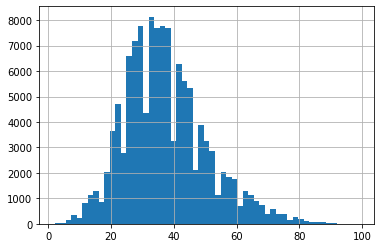

In [99]:
df.age.hist(bins=55)

In [100]:
df = df[(df.age < df.age.quantile(.99))]
df = df[(df.age > df.age.quantile(.01))]

<AxesSubplot:>

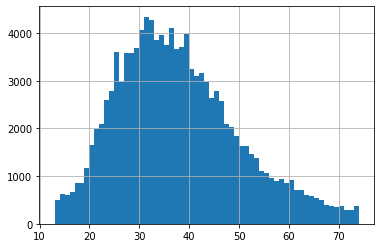

In [101]:
df.age.hist(bins=61)

In [103]:
df = df.groupby('age').head(2000)
df

,Unnamed: 0.1,Unnamed: 0,dob,photo_taken,full_path,gender,name,face_location,face_score,second_face_score,celeb_names,celeb_id,age,max_image_dim
0,0,0,1899,1968,01/nm0000001_rm124825600_1899-5-10_1968.jpg,1.0,['Fred Astaire'],[[1072.926 161.838 1214.784 303.696]],1.459693,1.118973,"[""'Lee' George Quinones""]",6488,69,141.858000
1,1,1,1899,1970,01/nm0000001_rm3343756032_1899-5-10_1970.jpg,1.0,['Fred Astaire'],[[477.184 100.352 622.592 245.76 ]],2.543198,1.852008,"[""'Weird Al' Yankovic""]",6488,71,145.408000
2,3,3,1899,1968,01/nm0000001_rm946909184_1899-5-10_1968.jpg,1.0,['Fred Astaire'],[[622.88550564 424.21750384 844.33900767 645.6...,1.872117,NaN,['50 Cent'],6488,69,221.453502
3,4,4,1899,1968,01/nm0000001_rm980463616_1899-5-10_1968.jpg,1.0,['Fred Astaire'],[[1013.85900236 233.88204221 1201.5861278 4...,1.158766,NaN,['A Martinez'],6488,69,187.727125
8,20,20,1924,1988,02/nm0000002_rm2805435904_1924-9-16_1988.jpg,0.0,['Lauren Bacall'],[[548.38500497 200.71600181 769.838507 422.1...,3.410720,1.196696,['Aaron Carter'],11516,64,221.453502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121910,460481,460481,1988,2009,96/nm1997596_rm687179520_1988-7-13_2009.jpg,1.0,['Steven R. McQueen'],[[ 89.044 114.26 201.728 226.944]],1.435616,NaN,NaN,18273,21,112.684000
121914,460505,460505,1994,2015,94/nm1997794_rm1006150400_1994-3-19_2015.jpg,1.0,['Hudson Thames'],[[1071.978625 215.931725 1218.22058846 3...,3.662593,2.400289,NaN,7678,21,146.241963
121915,460511,460511,1994,2007,94/nm1997794_rm410756096_1994-3-19_2007.jpg,1.0,['Hudson Thames'],[[1515.36523271 261.47381132 1707.8865912 4...,3.015311,2.192660,NaN,7678,13,192.521358
121916,460514,460514,1994,2015,94/nm1997794_rm855155456_1994-3-19_2015.jpg,1.0,['Hudson Thames'],[[324.48 78.72 460.8 215.04]],2.422186,1.724368,NaN,7678,21,136.320000


In [105]:
from PIL import Image
import calendar
import time
import torch
import torchvision
import os

transform = torchvision.transforms.Compose([torchvision.transforms.RandomRotation(degrees=25),
                                            torchvision.transforms.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 5)),
                                            torchvision.transforms.RandomAdjustSharpness(sharpness_factor=2),
                                            torchvision.transforms.RandomAutocontrast(),
                                            ]
                                           )

img_root = "C:/Users/janba/PycharmProjects/imdb/imdb_crop"
for i in range(df.age.min(), df.age.max() + 1):
    age_df = df[df['age'] == i]
    _time = calendar.timegm(time.gmtime())
    for j in range(len(age_df), 2000):
        random_row = age_df.sample(ignore_index=True)
        path = random_row.full_path[0]
        # print(random_row)
        # print(path)
        img = Image.open(os.path.join(img_root, path))
        img = transform(img)
        save_path = os.path.join(img_root, f"generated/" + str(_time) + "_" + str(j) + ".jpg")
        img = img.save(save_path)
        dict = {'age': random_row.age[0], 'full_path': f"generated/" + str(_time) + "_" + str(j) + ".jpg",
                'name': random_row.name[0]}
        df = df.append(dict, ignore_index=True)


C:\Users\janba\AppData\Local\Temp\ipykernel_788\1836851446.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict, ignore_index=True)
C:\Users\janba\AppData\Local\Temp\ipykernel_788\1836851446.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict, ignore_index=True)
C:\Users\janba\AppData\Local\Temp\ipykernel_788\1836851446.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict, ignore_index=True)
C:\Users\janba\AppData\Local\Temp\ipykernel_788\1836851446.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict, ignore_index=True)
C:\Users\janba\AppData\Local\Temp\ip

In [106]:
df

,Unnamed: 0.1,Unnamed: 0,dob,photo_taken,full_path,gender,name,face_location,face_score,second_face_score,celeb_names,celeb_id,age,max_image_dim
0,0.0,0.0,1899.0,1968.0,01/nm0000001_rm124825600_1899-5-10_1968.jpg,1.0,['Fred Astaire'],[[1072.926 161.838 1214.784 303.696]],1.459693,1.118973,"[""'Lee' George Quinones""]",6488.0,69,141.858000
1,1.0,1.0,1899.0,1970.0,01/nm0000001_rm3343756032_1899-5-10_1970.jpg,1.0,['Fred Astaire'],[[477.184 100.352 622.592 245.76 ]],2.543198,1.852008,"[""'Weird Al' Yankovic""]",6488.0,71,145.408000
2,3.0,3.0,1899.0,1968.0,01/nm0000001_rm946909184_1899-5-10_1968.jpg,1.0,['Fred Astaire'],[[622.88550564 424.21750384 844.33900767 645.6...,1.872117,NaN,['50 Cent'],6488.0,69,221.453502
3,4.0,4.0,1899.0,1968.0,01/nm0000001_rm980463616_1899-5-10_1968.jpg,1.0,['Fred Astaire'],[[1013.85900236 233.88204221 1201.5861278 4...,1.158766,NaN,['A Martinez'],6488.0,69,187.727125
4,20.0,20.0,1924.0,1988.0,02/nm0000002_rm2805435904_1924-9-16_1988.jpg,0.0,['Lauren Bacall'],[[548.38500497 200.71600181 769.838507 422.1...,3.410720,1.196696,['Aaron Carter'],11516.0,64,221.453502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123995,NaN,NaN,NaN,NaN,generated/1649290500_1995.jpg,NaN,['Frank Langella'],NaN,NaN,NaN,NaN,NaN,74,NaN
123996,NaN,NaN,NaN,NaN,generated/1649290500_1996.jpg,NaN,['Hector Elizondo'],NaN,NaN,NaN,NaN,NaN,74,NaN
123997,NaN,NaN,NaN,NaN,generated/1649290500_1997.jpg,NaN,['F. Murray Abraham'],NaN,NaN,NaN,NaN,NaN,74,NaN
123998,NaN,NaN,NaN,NaN,generated/1649290500_1998.jpg,NaN,['James Cromwell'],NaN,NaN,NaN,NaN,NaN,74,NaN


In [107]:
df.to_csv("oversampled.csv")

<AxesSubplot:>

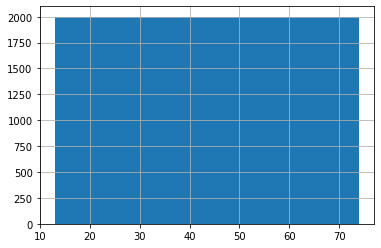

In [109]:
df.age.hist(bins=62)